<a href="https://colab.research.google.com/github/alisharifi2000/ComplexNetwork_TMU/blob/main/ComplexNetworkProject_phase1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/gdrive')

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).


In [2]:
import networkx as nx
import pandas as pd
import random
%matplotlib inline
from matplotlib import pyplot as plt
import collections

In [3]:
root = '/gdrive/My Drive/ComplexNetwork/'
G = nx.read_edgelist(root + 'p2p-Gnutella06.txt', create_using=nx.DiGraph)
# G = nx.read_edgelist(root + 'p2p-Gnutella06.txt')
print(nx.info(G))

Name: 
Type: DiGraph
Number of nodes: 8717
Number of edges: 31525
Average in degree:   3.6165
Average out degree:   3.6165


In [4]:
print(len(G.nodes))

8717


In [5]:
print(G.edges)

[('0', '1'), ('0', '2'), ('0', '3'), ('0', '4'), ('0', '5'), ('0', '6'), ('0', '7'), ('0', '8'), ('0', '9'), ('0', '10'), ('6', '21'), ('6', '327'), ('6', '619'), ('6', '1828'), ('6', '2173'), ('6', '2201'), ('6', '2743'), ('6', '2744'), ('6', '2745'), ('6', '2746'), ('8', '372'), ('8', '437'), ('8', '816'), ('8', '1826'), ('8', '1913'), ('8', '2303'), ('8', '2734'), ('8', '2735'), ('8', '2736'), ('8', '2737'), ('9', '35'), ('9', '321'), ('9', '446'), ('9', '1184'), ('9', '1542'), ('9', '2738'), ('9', '2739'), ('9', '2740'), ('9', '2741'), ('9', '2742'), ('10', '170'), ('10', '556'), ('10', '558'), ('10', '882'), ('10', '1059'), ('10', '2752'), ('10', '2753'), ('10', '2754'), ('10', '2755'), ('10', '2756'), ('327', '1458'), ('327', '2111'), ('327', '3941'), ('327', '4240'), ('327', '4271'), ('327', '5330'), ('327', '5331'), ('327', '5332'), ('327', '5333'), ('327', '5334'), ('1828', '60'), ('1828', '579'), ('1828', '1119'), ('1828', '1561'), ('1828', '2756'), ('1828', '3296'), ('1828',

In [6]:
degree_sequence = []
for node, degree in G.degree():
    degree_sequence.append(degree)
degree_sequence = sorted(degree_sequence, reverse=True)

In [7]:
degree_sequence = sorted((d for n, d in G.degree()), reverse=True)

In [8]:
degree_sequence[:10]

[115, 73, 72, 70, 70, 69, 69, 69, 67, 67]

In [9]:
in_degree_sequence = []
for node, degree in G.in_degree():
    in_degree_sequence.append(degree)
in_degree_sequence = sorted(in_degree_sequence, reverse=True)

In [10]:
in_degree_sequence = sorted((d for n, d in G.in_degree()), reverse=True)

In [11]:
for node, degree in G.degree():
    if degree in [115, 73, 72, 70, 69, 67]:
        print(node)

556
558
31
173
176
356
293
299
300
6494


In [12]:
dmax = max(degree_sequence)
dmax

115

In [13]:
degreeCount = collections.Counter(degree_sequence)
deg, cnt = zip(*degreeCount.items())
print(deg)

(115, 73, 72, 70, 69, 67, 66, 64, 63, 62, 60, 59, 58, 57, 56, 55, 54, 53, 51, 50, 49, 48, 47, 46, 45, 44, 42, 41, 40, 39, 38, 37, 36, 35, 34, 32, 31, 30, 29, 28, 27, 26, 25, 24, 23, 22, 21, 20, 19, 18, 17, 16, 15, 14, 13, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1)


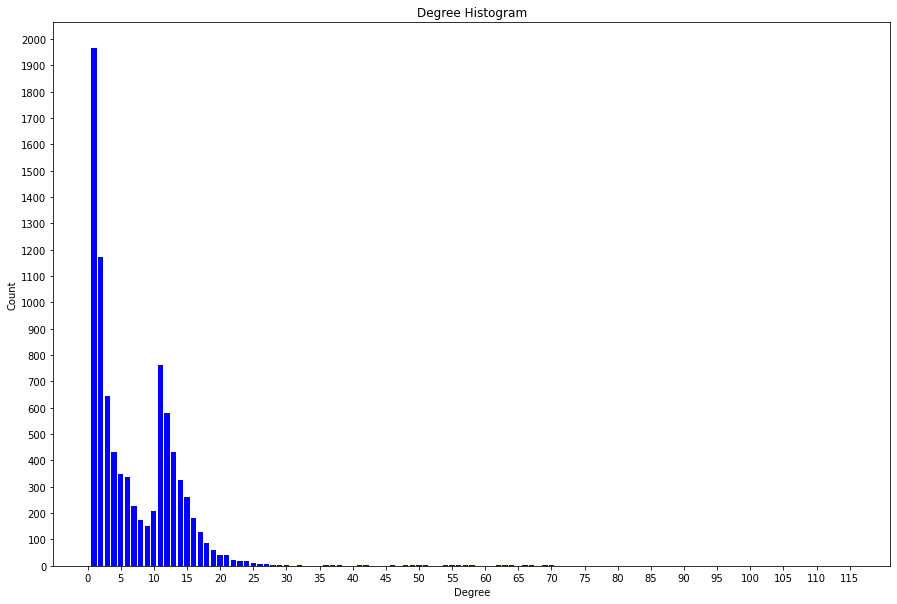

In [14]:
plt.figure(figsize=(15,10))
plt.bar(deg, cnt, width=0.80, color="b")

plt.title("Degree Histogram")
plt.ylabel("Count")
plt.xlabel("Degree")
plt.xticks(range(0,dmax+5,5))
plt.yticks(range(0,2100,100))
plt.show()

In [15]:
pos = nx.spring_layout(G)

In [ ]:
type(pos)

dict

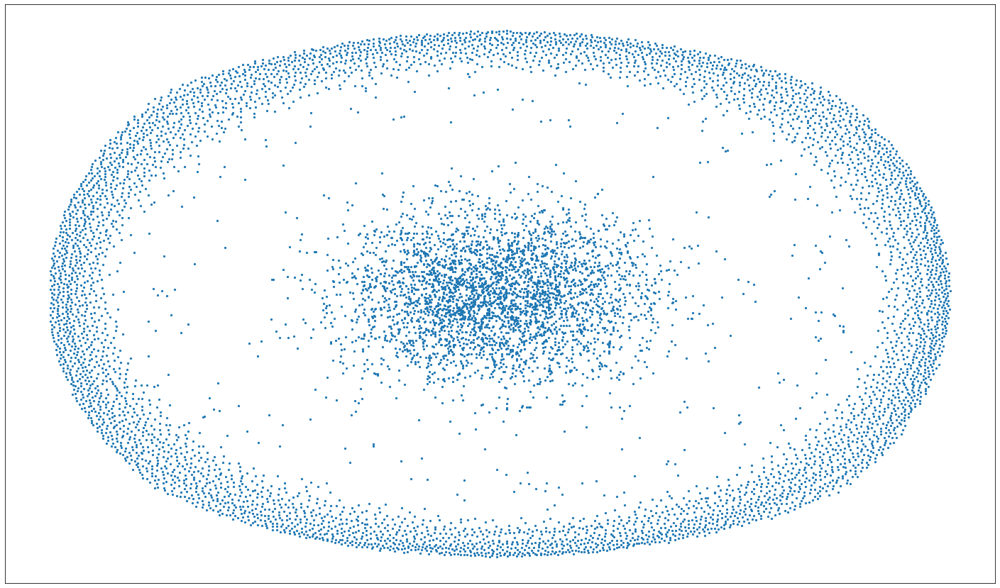

In [ ]:
plt.figure(figsize=(25,15))
nx.draw_networkx_nodes(G, pos, node_size=5)
plt.show()

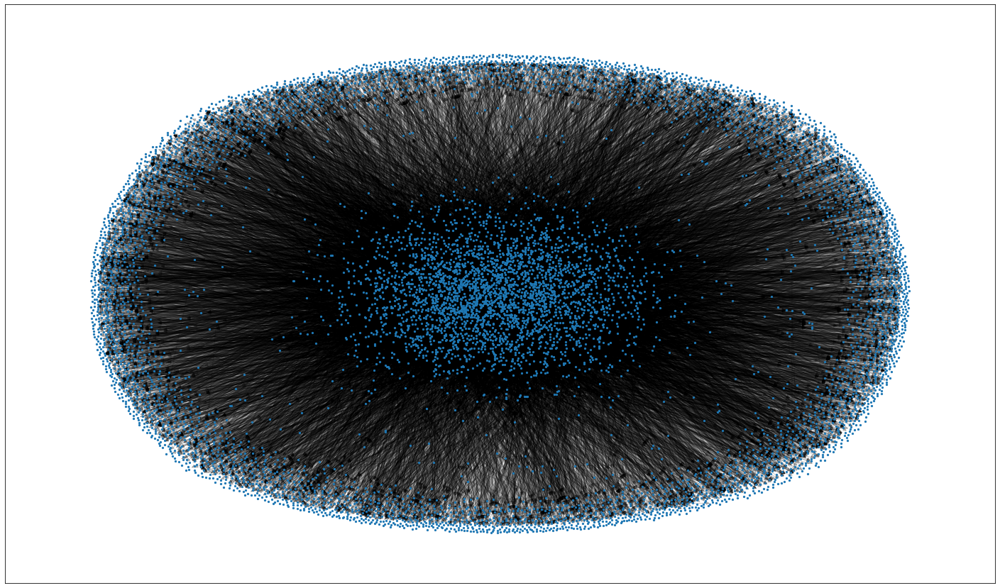

In [ ]:
plt.figure(figsize=(25,15))
nx.draw_networkx_nodes(G, pos, node_size=5)
nx.draw_networkx_edges(G, pos, alpha=0.2)
plt.show()

In [ ]:
s_path = nx.average_shortest_path_length(G)
print('average shortest path : {}'.format(s_path))

average shortest path : 2.4515828475878316


In [ ]:
 nx.shortest_path(G, source='0', target='1010')

['0', '10', '556', '341', '231', '237', '2098', '2221', '1010']

In [ ]:
length = dict(nx.all_pairs_shortest_path_length(G))
df = pd.DataFrame.from_dict(length)
df.head()

,0,1,2,3,4,5,6,7,8,9,10,21,327,619,1828,2173,2201,2743,2744,2745,2746,372,437,816,1826,1913,2303,2734,2735,2736,2737,35,321,446,1184,1542,2738,2739,2740,2741,...,8659,8660,8661,8662,8667,8668,8669,8670,8676,8677,8678,8671,8672,8673,8686,8709,8715,8689,8690,8692,8693,8694,8697,8695,8696,8699,8700,8701,8702,8703,8704,8705,8707,8706,8710,8711,8712,8713,8714,8716
0,0.0,NaN,NaN,NaN,NaN,NaN,6.0,NaN,6.0,6.0,5.0,NaN,7.0,NaN,6.0,5.0,NaN,NaN,NaN,6.0,6.0,NaN,NaN,7.0,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,5.0,NaN,NaN,...,NaN,6.0,5.0,7.0,7.0,NaN,6.0,7.0,NaN,NaN,6.0,5.0,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,7.0,NaN,5.0,8.0,NaN,NaN,NaN,6.0,5.0,NaN,NaN,8.0,NaN,NaN,6.0,5.0
1,1.0,0.0,NaN,NaN,NaN,NaN,7.0,NaN,7.0,7.0,6.0,NaN,6.0,NaN,6.0,6.0,NaN,NaN,NaN,6.0,6.0,NaN,NaN,6.0,NaN,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,NaN,NaN,NaN,6.0,NaN,NaN,...,NaN,7.0,6.0,6.0,5.0,NaN,5.0,6.0,NaN,NaN,6.0,6.0,NaN,NaN,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.0,5.0,NaN,6.0,5.0,NaN,NaN,NaN,6.0,6.0,NaN,NaN,8.0,NaN,NaN,6.0,6.0
7,1.0,NaN,NaN,NaN,NaN,NaN,3.0,0.0,2.0,4.0,3.0,NaN,6.0,NaN,5.0,2.0,NaN,NaN,NaN,3.0,4.0,NaN,NaN,1.0,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,4.0,NaN,NaN,...,NaN,5.0,3.0,5.0,5.0,NaN,5.0,4.0,NaN,NaN,5.0,5.0,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,4.0,NaN,6.0,7.0,NaN,NaN,NaN,3.0,2.0,NaN,NaN,5.0,NaN,NaN,5.0,4.0
6,1.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,5.0,5.0,4.0,NaN,5.0,NaN,5.0,6.0,NaN,NaN,NaN,4.0,4.0,NaN,NaN,5.0,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,NaN,NaN,NaN,4.0,NaN,NaN,...,NaN,5.0,5.0,5.0,5.0,NaN,5.0,6.0,NaN,NaN,5.0,5.0,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.0,6.0,NaN,5.0,7.0,NaN,NaN,NaN,5.0,6.0,NaN,NaN,7.0,NaN,NaN,4.0,5.0
10,1.0,NaN,NaN,NaN,NaN,NaN,6.0,NaN,5.0,7.0,0.0,NaN,6.0,NaN,6.0,5.0,NaN,NaN,NaN,5.0,5.0,NaN,NaN,4.0,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,NaN,NaN,NaN,6.0,NaN,NaN,...,NaN,6.0,6.0,6.0,5.0,NaN,5.0,6.0,NaN,NaN,5.0,6.0,NaN,NaN,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,5.0,NaN,5.0,5.0,NaN,NaN,NaN,4.0,6.0,NaN,NaN,7.0,NaN,NaN,5.0,5.0


In [ ]:
# s_paths = dict(nx.all_pairs_shortest_path(G))
# df = pd.DataFrame.from_dict(s_paths)
# df.fillna('[]',inplace = True)
# df.head()

In [ ]:
# df.shape

In [ ]:
# df.to_csv(root+'shortest_path.csv',index = False)

In [ ]:
df = pd.read_csv(root+'shortest_path.csv')
df.head()

,0,1,2,3,4,5,6,7,8,9,10,21,327,619,1828,2173,2201,2743,2744,2745,2746,372,437,816,1826,1913,2303,2734,2735,2736,2737,35,321,446,1184,1542,2738,2739,2740,2741,...,8659,8660,8661,8662,8667,8668,8669,8670,8676,8677,8678,8671,8672,8673,8686,8709,8715,8689,8690,8692,8693,8694,8697,8695,8696,8699,8700,8701,8702,8703,8704,8705,8707,8706,8710,8711,8712,8713,8714,8716
0,['0'],[],[],[],[],[],"['6', '2173', '3434', '5780', '7066', '260', '0']",[],"['8', '1913', '839', '2816', '5383', '260', '0']","['9', '446', '1248', '3761', '3279', '1639', '0']","['10', '2753', '3214', '3057', '260', '0']",[],"['327', '1458', '1466', '3550', '4902', '5383'...",[],"['1828', '1119', '298', '1601', '3856', '1639'...","['2173', '3434', '5780', '7066', '260', '0']",[],[],[],"['2745', '3539', '67', '2816', '5383', '260', ...","['2746', '173', '357', '3214', '3057', '260', ...",[],[],"['816', '2843', '3867', '4554', '688', '695', ...",[],"['1913', '839', '2816', '5383', '260', '0']",[],[],[],[],[],[],[],"['446', '1248', '3761', '3279', '1639', '0']",[],[],[],"['2739', '964', '3954', '4949', '260', '0']",[],[],...,[],"['8660', '8277', '1064', '4232', '6681', '1639...","['8661', '3300', '3214', '3057', '260', '0']","['8662', '1432', '3040', '357', '3214', '3057'...","['8667', '4921', '833', '1618', '1622', '3411'...",[],"['8669', '5003', '4778', '2912', '4949', '260'...","['8670', '1612', '2488', '67', '2816', '5383',...",[],[],"['8678', '4982', '6663', '4232', '6681', '1639...","['8671', '961', '215', '3057', '260', '0']",[],[],"['8686', '8150', '2027', '3411', '260', '0']",[],[],[],[],[],[],[],[],"['8695', '6828', '5202', '6784', '6824', '1639...","['8696', '1885', '1889', '1303', '4227', '3411...",[],"['8700', '858', '866', '3856', '1639', '0']","['8701', '6073', '7237', '3668', '3292', '1315...",[],[],[],"['8705', '471', '473', '3214', '3057', '260', ...","['8707', '2957', '383', '3006', '1639', '0']",[],[],"['8711', '452', '1545', '4164', '247', '370', ...",[],[],"['8714', '8716', '5114', '2181', '4949', '260'...","['8716', '5114', '2181', '4949', '260', '0']"
1,"['0', '1']",['1'],[],[],[],[],"['6', '327', '4240', '1002', '553', '4289', '3...",[],"['8', '816', '3063', '454', '1372', '4308', '3...","['9', '446', '1248', '3761', '3279', '1639', '...","['10', '2753', '3214', '3057', '260', '0', '1']",[],"['327', '4240', '1002', '553', '4289', '3692',...",[],"['1828', '4667', '213', '553', '4289', '3692',...","['2173', '562', '545', '553', '4289', '3692', ...",[],[],[],"['2745', '4576', '172', '1372', '4308', '3692'...","['2746', '173', '350', '553', '4289', '3692', ...",[],[],"['816', '3063', '454', '1372', '4308', '3692',...",[],"['1913', '839', '2816', '5383', '260', '0', '1']",[],[],[],[],[],[],[],"['446', '1248', '3761', '3279', '1639', '0', '1']",[],[],[],"['2739', '964', '3954', '4949', '260', '0', '1']",[],[],...,[],"['8660', '4744', '6023', '291', '553', '4289',...","['8661', '3300', '3214', '3057', '260', '0', '1']","['8662', '8669', '5003', '3999', '4308', '3692...","['8667', '4921', '6610', '4289', '3692', '1']",[],"['8669', '5003', '3999', '4308', '3692', '1']","['8670', '8701', '6073', '7237', '7847', '5858...",[],[],"['8678', '4982', '291', '553', '4289', '3692',...","['8671', '799', '291', '553', '4289', '3692', ...",[],[],"['8686', '8150', '2027', '3411', '260', '0', '1']",[],[],[],[],[],[],[],[],"['8695', '6828', '5202', '6784', '6824', '1639...","['8696', '1002', '553', '4289', '3692', '1']",[],"['8700', '858', '866', '3856', '1639', '0', '1']","['8701', '6073', '7237', '7847', '5858', '1']",[],[],[],"['8705', '2574', '291', '553', '4289', '3692',...","['8707', '2957', '383', '3006', '1639', '0', '1']",[],[],"['8711', '7046', '2936', '1916', '545', '553',...",[],[],"['8714', '8571', '172', '1372', '4308', '3692'...","['8716', '5114', '2181', '4949', '260', '0', '1']"
2,"['0', '2']",[],['2'],[],[],[],"['6', '2745', '4010', '2911', '6045', '54', '2']",[],"['8', '1913', '839', '2816', '1264', '54', '2']","['9', '446', '2204', '2081', '4846', '2

In [ ]:
# def find_len(x):
#     return len(x)

# temp = df.copy()
# for cols in temp.columns:
#     temp[cols] = temp[cols].apply(find_len)

# temp.head()

In [ ]:
# temp.max(axis=1)

In [ ]:
# temp.idxmax(axis=1)

In [ ]:
# df.to_csv(root+'shortest_path.csv',index = False)

In [ ]:
df = pd.read_csv(root+'shortest_path.csv')
df.head()

,0,1,2,3,4,5,6,7,8,9,10,21,327,619,1828,2173,2201,2743,2744,2745,2746,372,437,816,1826,1913,2303,2734,2735,2736,2737,35,321,446,1184,1542,2738,2739,2740,2741,...,8659,8660,8661,8662,8667,8668,8669,8670,8676,8677,8678,8671,8672,8673,8686,8709,8715,8689,8690,8692,8693,8694,8697,8695,8696,8699,8700,8701,8702,8703,8704,8705,8707,8706,8710,8711,8712,8713,8714,8716
0,['0'],[],[],[],[],[],"['6', '2173', '3434', '5780', '7066', '260', '0']",[],"['8', '1913', '839', '2816', '5383', '260', '0']","['9', '446', '1248', '3761', '3279', '1639', '0']","['10', '2753', '3214', '3057', '260', '0']",[],"['327', '1458', '1466', '3550', '4902', '5383'...",[],"['1828', '1119', '298', '1601', '3856', '1639'...","['2173', '3434', '5780', '7066', '260', '0']",[],[],[],"['2745', '3539', '67', '2816', '5383', '260', ...","['2746', '173', '357', '3214', '3057', '260', ...",[],[],"['816', '2843', '3867', '4554', '688', '695', ...",[],"['1913', '839', '2816', '5383', '260', '0']",[],[],[],[],[],[],[],"['446', '1248', '3761', '3279', '1639', '0']",[],[],[],"['2739', '964', '3954', '4949', '260', '0']",[],[],...,[],"['8660', '8277', '1064', '4232', '6681', '1639...","['8661', '3300', '3214', '3057', '260', '0']","['8662', '1432', '3040', '357', '3214', '3057'...","['8667', '4921', '833', '1618', '1622', '3411'...",[],"['8669', '5003', '4778', '2912', '4949', '260'...","['8670', '1612', '2488', '67', '2816', '5383',...",[],[],"['8678', '4982', '6663', '4232', '6681', '1639...","['8671', '961', '215', '3057', '260', '0']",[],[],"['8686', '8150', '2027', '3411', '260', '0']",[],[],[],[],[],[],[],[],"['8695', '6828', '5202', '6784', '6824', '1639...","['8696', '1885', '1889', '1303', '4227', '3411...",[],"['8700', '858', '866', '3856', '1639', '0']","['8701', '6073', '7237', '3668', '3292', '1315...",[],[],[],"['8705', '471', '473', '3214', '3057', '260', ...","['8707', '2957', '383', '3006', '1639', '0']",[],[],"['8711', '452', '1545', '4164', '247', '370', ...",[],[],"['8714', '8716', '5114', '2181', '4949', '260'...","['8716', '5114', '2181', '4949', '260', '0']"
1,"['0', '1']",['1'],[],[],[],[],"['6', '327', '4240', '1002', '553', '4289', '3...",[],"['8', '816', '3063', '454', '1372', '4308', '3...","['9', '446', '1248', '3761', '3279', '1639', '...","['10', '2753', '3214', '3057', '260', '0', '1']",[],"['327', '4240', '1002', '553', '4289', '3692',...",[],"['1828', '4667', '213', '553', '4289', '3692',...","['2173', '562', '545', '553', '4289', '3692', ...",[],[],[],"['2745', '4576', '172', '1372', '4308', '3692'...","['2746', '173', '350', '553', '4289', '3692', ...",[],[],"['816', '3063', '454', '1372', '4308', '3692',...",[],"['1913', '839', '2816', '5383', '260', '0', '1']",[],[],[],[],[],[],[],"['446', '1248', '3761', '3279', '1639', '0', '1']",[],[],[],"['2739', '964', '3954', '4949', '260', '0', '1']",[],[],...,[],"['8660', '4744', '6023', '291', '553', '4289',...","['8661', '3300', '3214', '3057', '260', '0', '1']","['8662', '8669', '5003', '3999', '4308', '3692...","['8667', '4921', '6610', '4289', '3692', '1']",[],"['8669', '5003', '3999', '4308', '3692', '1']","['8670', '8701', '6073', '7237', '7847', '5858...",[],[],"['8678', '4982', '291', '553', '4289', '3692',...","['8671', '799', '291', '553', '4289', '3692', ...",[],[],"['8686', '8150', '2027', '3411', '260', '0', '1']",[],[],[],[],[],[],[],[],"['8695', '6828', '5202', '6784', '6824', '1639...","['8696', '1002', '553', '4289', '3692', '1']",[],"['8700', '858', '866', '3856', '1639', '0', '1']","['8701', '6073', '7237', '7847', '5858', '1']",[],[],[],"['8705', '2574', '291', '553', '4289', '3692',...","['8707', '2957', '383', '3006', '1639', '0', '1']",[],[],"['8711', '7046', '2936', '1916', '545', '553',...",[],[],"['8714', '8571', '172', '1372', '4308', '3692'...","['8716', '5114', '2181', '4949', '260', '0', '1']"
2,"['0', '2']",[],['2'],[],[],[],"['6', '2745', '4010', '2911', '6045', '54', '2']",[],"['8', '1913', '839', '2816', '1264', '54', '2']","['9', '446', '2204', '2081', '4846', '2

In [ ]:
del df

In [ ]:
largest_scc = max(nx.strongly_connected_components(G), key=len)

In [ ]:
SCC = G.subgraph(largest_scc)

In [ ]:
print(list(SCC.edges))

[('6828', '499'), ('6828', '5202'), ('6828', '5638'), ('6828', '6855'), ('6828', '7543'), ('4020', '291'), ('4020', '292'), ('4020', '293'), ('4020', '296'), ('4020', '299'), ('4020', '300'), ('4020', '351'), ('4020', '353'), ('4020', '357'), ('4020', '4488'), ('5510', '670'), ('5510', '1487'), ('5510', '4798'), ('5510', '6913'), ('5839', '1089'), ('5839', '2002'), ('5839', '2212'), ('350', '471'), ('350', '553'), ('350', '2612'), ('350', '3244'), ('350', '3245'), ('3053', '307'), ('3053', '434'), ('3053', '564'), ('3053', '813'), ('3053', '2649'), ('5357', '5860'), ('8326', '65'), ('8326', '985'), ('8326', '5578'), ('8326', '8463'), ('2115', '4853'), ('2115', '4883'), ('2638', '176'), ('2638', '5264'), ('3464', '154'), ('3464', '397'), ('3464', '1532'), ('3464', '2222'), ('6500', '1825'), ('6500', '4827'), ('6500', '5767'), ('4405', '907'), ('7167', '2638'), ('7167', '3868'), ('7167', '4444'), ('7167', '7767'), ('2111', '1190'), ('2111', '2113'), ('2111', '2115'), ('2111', '2117'), ('

In [ ]:
print(nx.info(SCC))

Name: 
Type: DiGraph
Number of nodes: 3226
Number of edges: 13589
Average in degree:   4.2123
Average out degree:   4.2123


In [ ]:
print(nx.distance_measures.diameter(SCC))

19


In [ ]:
pos_scc = nx.spring_layout(SCC)

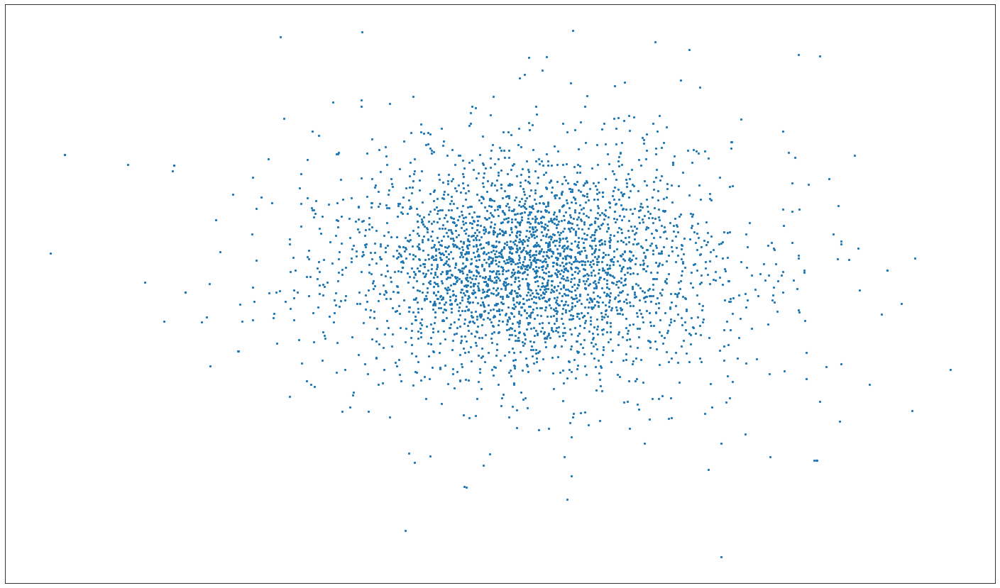

In [ ]:
plt.figure(figsize=(25,15))
nx.draw_networkx_nodes(SCC, pos_scc, node_size=5)
plt.show()

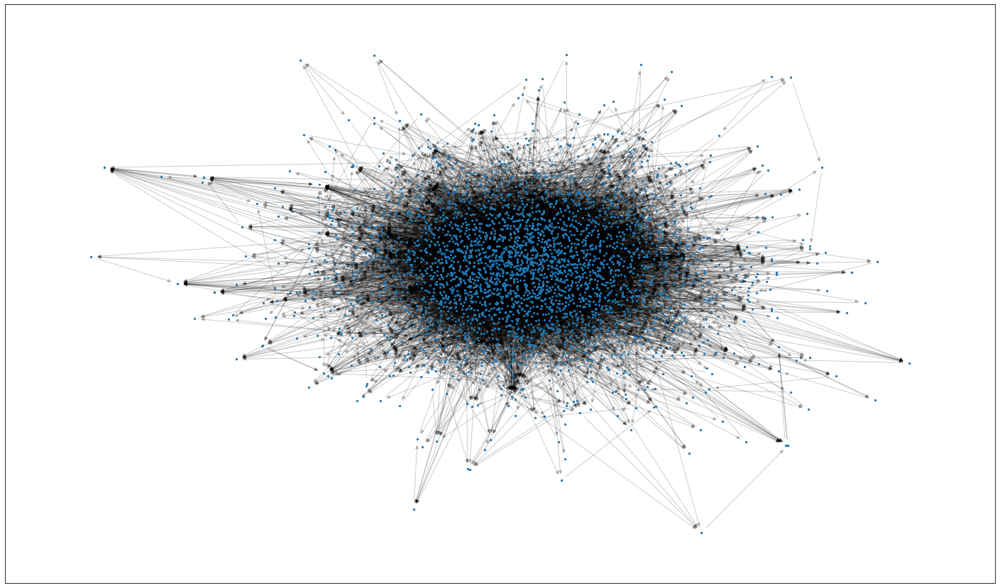

In [ ]:
plt.figure(figsize=(25,15))
nx.draw_networkx_nodes(SCC, pos_scc, node_size=5)
nx.draw_networkx_edges(SCC, pos_scc, alpha=0.2)
plt.show()

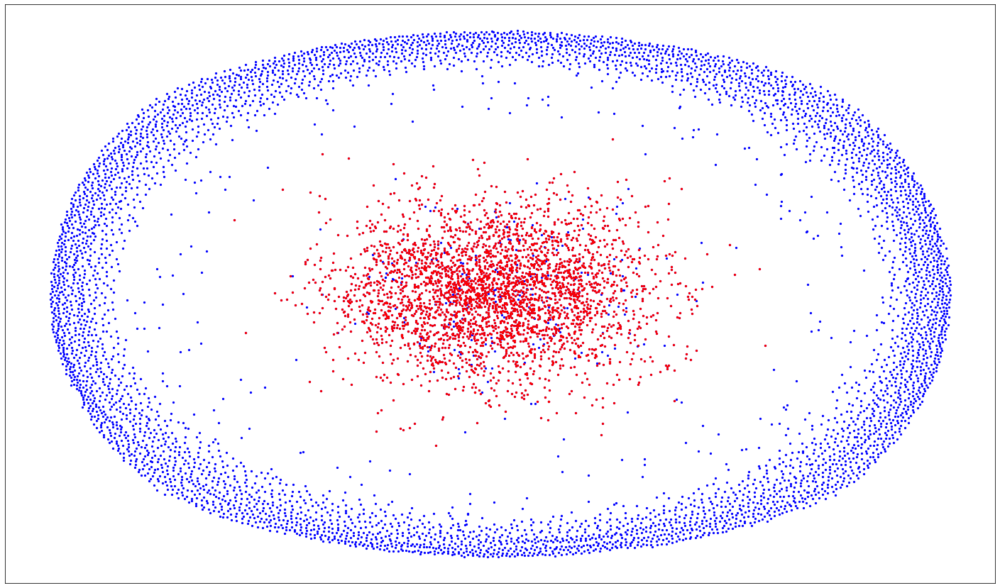

In [ ]:
plt.figure(figsize=(25,15))
nx.draw_networkx_nodes(G, pos,node_color = 'blue', node_size=5)
nx.draw_networkx_nodes(SCC, pos,node_color = 'red', node_size=5)
plt.show()

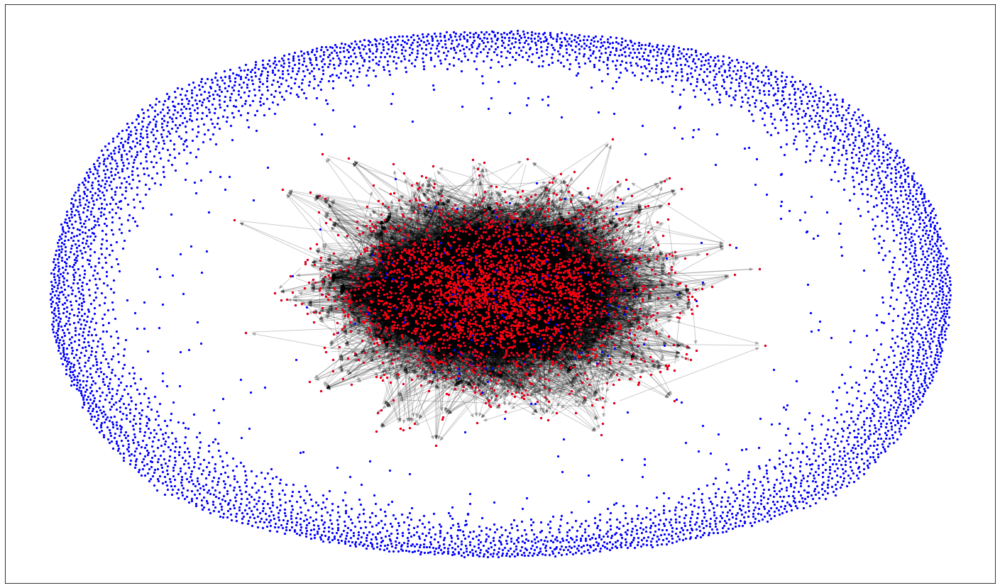

In [ ]:
plt.figure(figsize=(25,15))
nx.draw_networkx_nodes(G, pos,node_color = 'blue', node_size=5)
nx.draw_networkx_nodes(SCC, pos,node_color = 'red', node_size=5)
nx.draw_networkx_edges(SCC, pos, alpha=0.2)
plt.show()

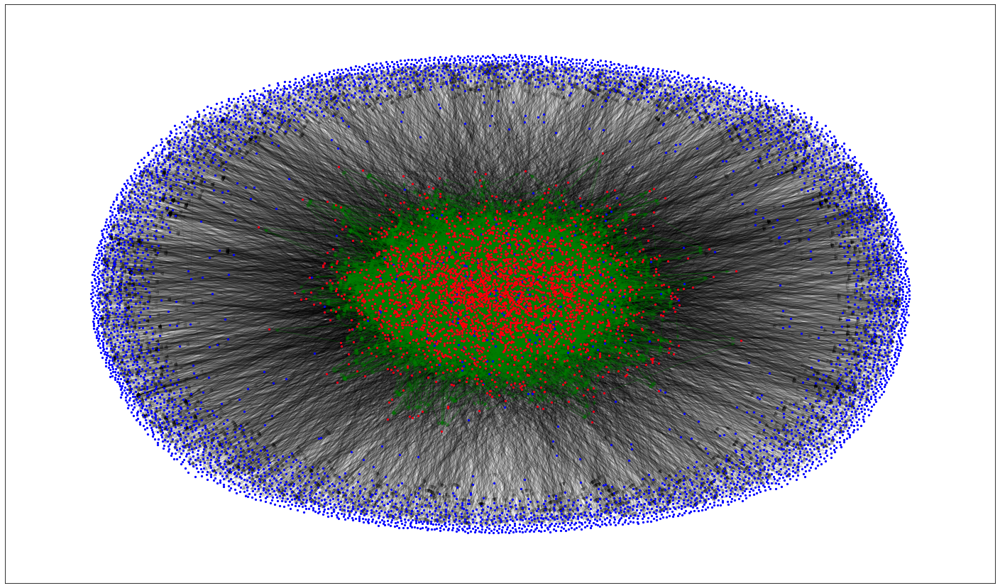

In [ ]:
plt.figure(figsize=(25,15))
nx.draw_networkx_nodes(G, pos,node_color = 'blue', node_size=5)
nx.draw_networkx_nodes(SCC, pos,node_color = 'red', node_size=5)
nx.draw_networkx_edges(G, pos, alpha=0.1 ,edge_color = 'black')
nx.draw_networkx_edges(SCC, pos, alpha=0.3 ,edge_color = 'green')
plt.show()

In [ ]:
largest_wcc = max(nx.weakly_connected_components(G), key=len)

In [ ]:
WCC = G.subgraph(largest_wcc)

In [ ]:
print(list(WCC.edges))

[('0', '1'), ('0', '2'), ('0', '3'), ('0', '4'), ('0', '5'), ('0', '6'), ('0', '7'), ('0', '8'), ('0', '9'), ('0', '10'), ('6', '21'), ('6', '327'), ('6', '619'), ('6', '1828'), ('6', '2173'), ('6', '2201'), ('6', '2743'), ('6', '2744'), ('6', '2745'), ('6', '2746'), ('8', '372'), ('8', '437'), ('8', '816'), ('8', '1826'), ('8', '1913'), ('8', '2303'), ('8', '2734'), ('8', '2735'), ('8', '2736'), ('8', '2737'), ('9', '35'), ('9', '321'), ('9', '446'), ('9', '1184'), ('9', '1542'), ('9', '2738'), ('9', '2739'), ('9', '2740'), ('9', '2741'), ('9', '2742'), ('10', '170'), ('10', '556'), ('10', '558'), ('10', '882'), ('10', '1059'), ('10', '2752'), ('10', '2753'), ('10', '2754'), ('10', '2755'), ('10', '2756'), ('327', '1458'), ('327', '2111'), ('327', '3941'), ('327', '4240'), ('327', '4271'), ('327', '5330'), ('327', '5331'), ('327', '5332'), ('327', '5333'), ('327', '5334'), ('1828', '60'), ('1828', '579'), ('1828', '1119'), ('1828', '1561'), ('1828', '2756'), ('1828', '3296'), ('1828',

In [ ]:
print(nx.info(WCC))

Name: 
Type: DiGraph
Number of nodes: 8717
Number of edges: 31525
Average in degree:   3.6165
Average out degree:   3.6165


In [ ]:
print(nx.distance_measures.diameter(WCC))

In [ ]:
pos_wcc = nx.spring_layout(WCC)

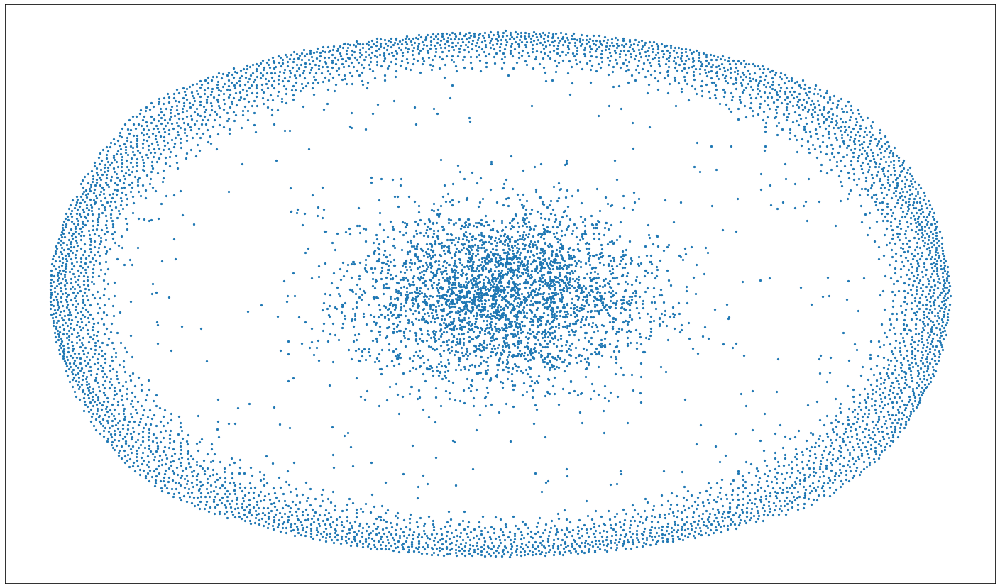

In [ ]:
plt.figure(figsize=(25,15))
nx.draw_networkx_nodes(WCC, pos_wcc, node_size=5)
plt.show()

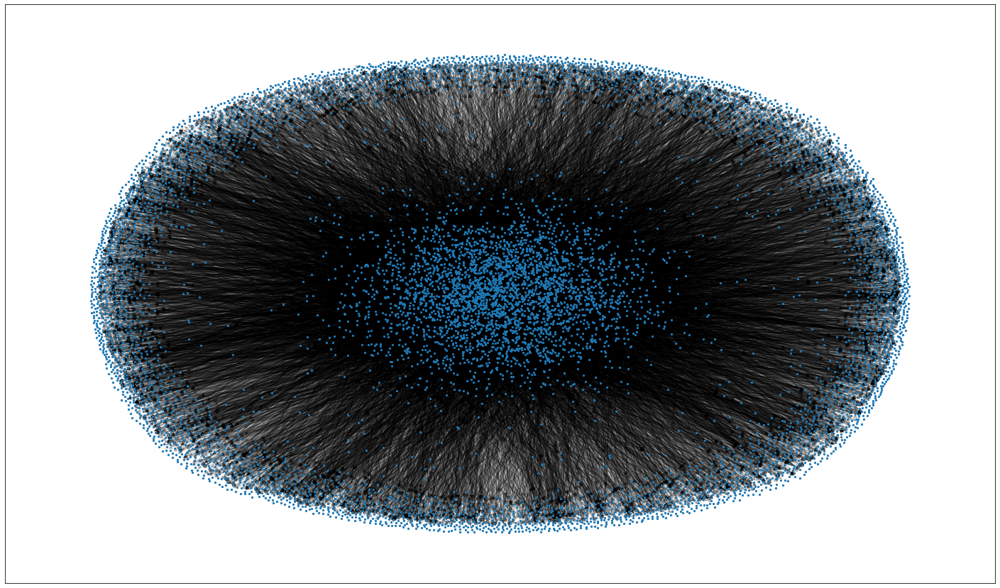

In [ ]:
plt.figure(figsize=(25,15))
nx.draw_networkx_nodes(WCC, pos_wcc, node_size=5)
nx.draw_networkx_edges(WCC, pos_wcc, alpha=0.2)
plt.show()

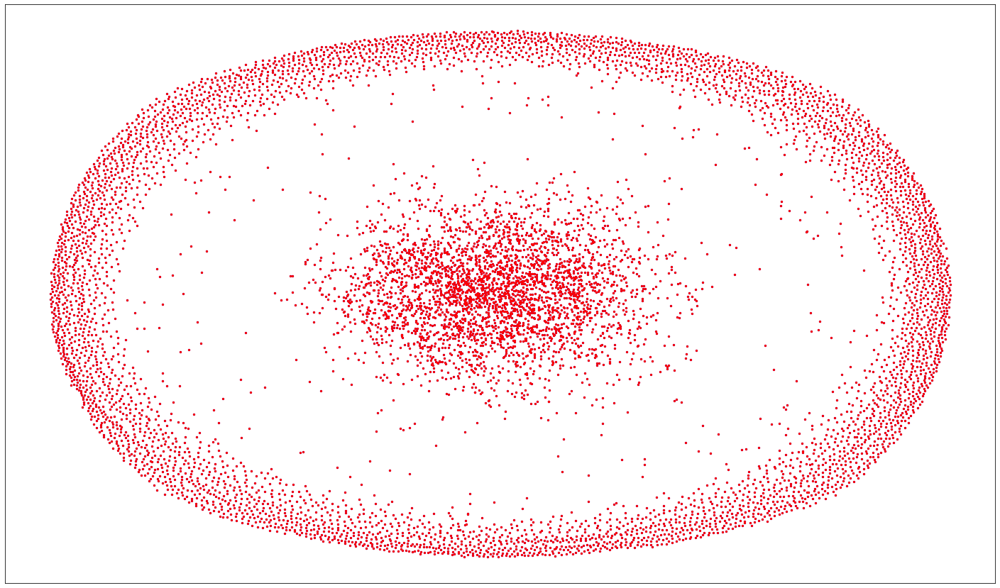

In [ ]:
plt.figure(figsize=(25,15))
nx.draw_networkx_nodes(G, pos,node_color = 'blue', node_size=5)
nx.draw_networkx_nodes(WCC, pos,node_color = 'red', node_size=5)
plt.show()

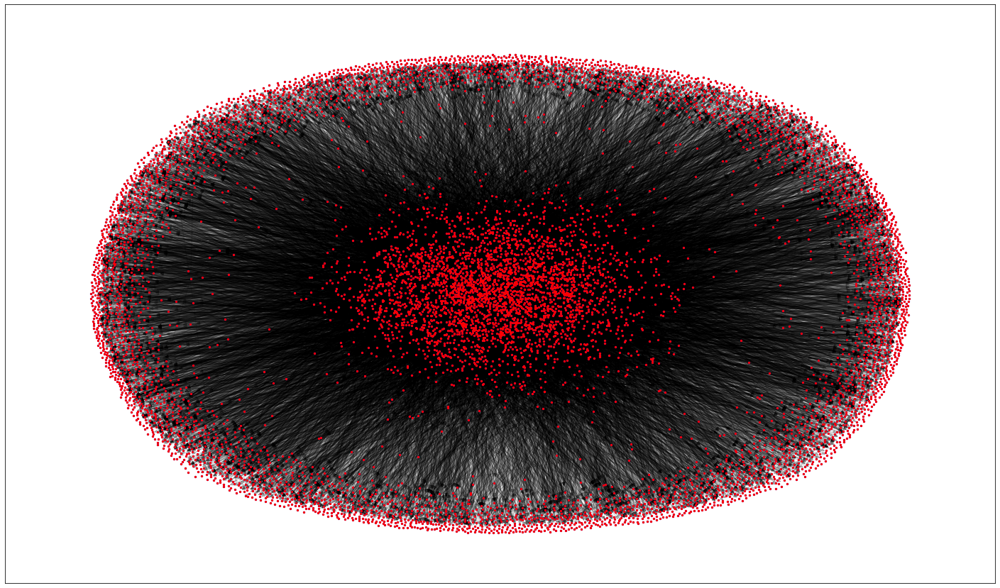

In [ ]:
plt.figure(figsize=(25,15))
nx.draw_networkx_nodes(G, pos,node_color = 'blue', node_size=5)
nx.draw_networkx_nodes(WCC, pos,node_color = 'red', node_size=5)
nx.draw_networkx_edges(WCC, pos, alpha=0.2)
plt.show()

In [16]:
dict = {}
max_l = 0
selected_node = []

while len(selected_node) <= int(len(G.nodes)/10):
    start_node = random.choice(list(G.nodes))
    if start_node not in selected_node:
        selected_node.append(start_node)
        l_bfs = len(list(nx.bfs_edges(G,start_node)))

        if l_bfs >= max_l:
            max_l = l_bfs

        dict[start_node] = l_bfs

print(selected_node)

['7253', '1727', '6764', '5258', '7872', '3432', '4509', '7520', '3405', '4378', '1254', '6062', '465', '7891', '6244', '650', '3709', '5779', '1737', '1144', '8103', '2475', '8151', '2225', '7643', '6687', '8144', '3329', '4679', '8309', '411', '1316', '3020', '6248', '7413', '6260', '1783', '3928', '5564', '1573', '8545', '209', '4885', '5448', '7129', '1748', '2358', '280', '1651', '5209', '8594', '2732', '6334', '63', '1910', '412', '7157', '6858', '4944', '6238', '5906', '1817', '1896', '2100', '5904', '429', '2118', '2129', '1217', '2067', '6217', '1796', '3908', '3718', '6553', '3032', '8400', '4542', '3625', '1195', '8406', '4314', '6240', '6362', '428', '7863', '5696', '592', '2055', '2655', '8446', '2501', '3504', '2319', '4418', '7486', '7166', '5732', '2617', '3999', '4727', '5830', '2890', '8083', '4820', '4659', '26', '231', '7293', '4404', '5607', '3853', '2795', '1177', '6197', '8249', '8432', '8374', '7826', '8033', '2490', '4027', '4306', '8224', '4408', '4075', '6846

In [17]:
print(dict)

{'7253': 0, '1727': 0, '6764': 0, '5258': 0, '7872': 8521, '3432': 0, '4509': 0, '7520': 0, '3405': 8521, '4378': 0, '1254': 0, '6062': 0, '465': 8521, '7891': 0, '6244': 0, '650': 0, '3709': 8521, '5779': 8521, '1737': 8521, '1144': 0, '8103': 0, '2475': 0, '8151': 0, '2225': 0, '7643': 0, '6687': 0, '8144': 8521, '3329': 0, '4679': 0, '8309': 8521, '411': 8521, '1316': 0, '3020': 8521, '6248': 8521, '7413': 8521, '6260': 0, '1783': 0, '3928': 0, '5564': 0, '1573': 8521, '8545': 8521, '209': 0, '4885': 0, '5448': 8521, '7129': 8521, '1748': 8524, '2358': 0, '280': 8521, '1651': 0, '5209': 0, '8594': 0, '2732': 8521, '6334': 8521, '63': 0, '1910': 0, '412': 0, '7157': 0, '6858': 0, '4944': 8521, '6238': 0, '5906': 0, '1817': 8523, '1896': 8521, '2100': 0, '5904': 0, '429': 0, '2118': 8521, '2129': 10, '1217': 8521, '2067': 8521, '6217': 0, '1796': 8521, '3908': 0, '3718': 8521, '6553': 0, '3032': 0, '8400': 0, '4542': 8521, '3625': 8521, '1195': 8521, '8406': 8521, '4314': 0, '6240': 0

In [18]:
print(len(G.nodes))

8717


In [19]:
print(max_l)

8531


In [20]:
s_node = []
for keys , values in dict.items():
    if values == max_l:
        s_node.append(keys)

In [21]:
print(len(s_node))
print(s_node)

1
['1868']


In [22]:
list(nx.bfs_edges(G,s_node[0]))

[('1868', '199'),
 ('1868', '413'),
 ('1868', '452'),
 ('1868', '497'),
 ('1868', '953'),
 ('1868', '1050'),
 ('1868', '1282'),
 ('1868', '1514'),
 ('1868', '1539'),
 ('1868', '1667'),
 ('1868', '1669'),
 ('1868', '1829'),
 ('1868', '2263'),
 ('1868', '2452'),
 ('1868', '2669'),
 ('1868', '3118'),
 ('1868', '3615'),
 ('1868', '3769'),
 ('1868', '3891'),
 ('1868', '4029'),
 ('1868', '4056'),
 ('1868', '4225'),
 ('1868', '4295'),
 ('1868', '4328'),
 ('1868', '4693'),
 ('1868', '4694'),
 ('1868', '4695'),
 ('1868', '4696'),
 ('1868', '4697'),
 ('1868', '4698'),
 ('1868', '4699'),
 ('1868', '4700'),
 ('1868', '4701'),
 ('1868', '4702'),
 ('1868', '4703'),
 ('1868', '4704'),
 ('1868', '4705'),
 ('1868', '4706'),
 ('1868', '4707'),
 ('1868', '4708'),
 ('199', '200'),
 ('199', '201'),
 ('199', '202'),
 ('199', '203'),
 ('199', '204'),
 ('199', '205'),
 ('199', '206'),
 ('199', '207'),
 ('199', '208'),
 ('199', '209'),
 ('452', '109'),
 ('452', '1047'),
 ('452', '1545'),
 ('452', '1574'),
 ('4

In [23]:
GC = nx.Graph()
GC.add_edges_from(list(nx.bfs_edges(G,s_node[0])))

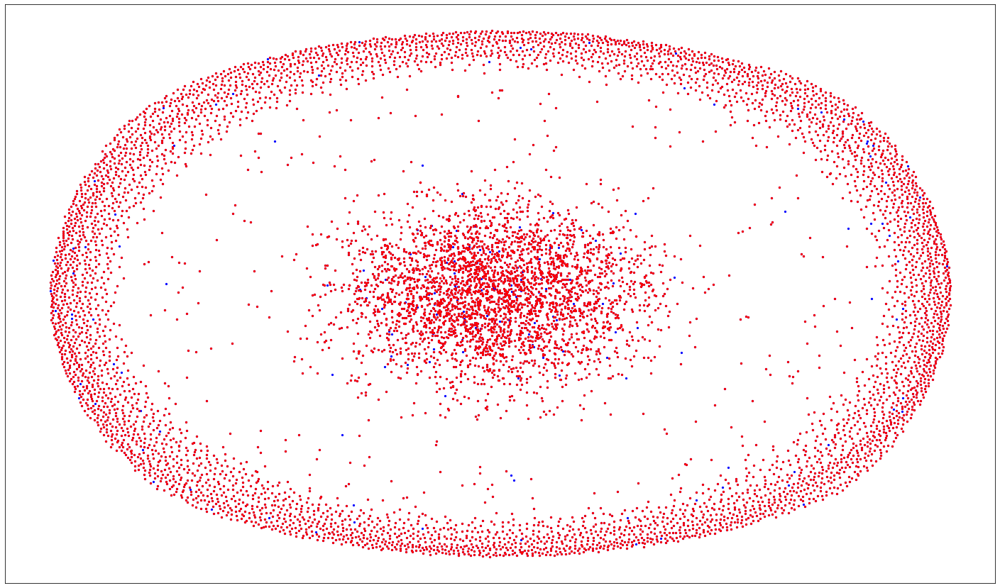

In [24]:
plt.figure(figsize=(25,15))
nx.draw_networkx_nodes(G, pos,node_color = 'blue', node_size=5)
nx.draw_networkx_nodes(GC, pos,node_color = 'red', node_size=5)
plt.show()

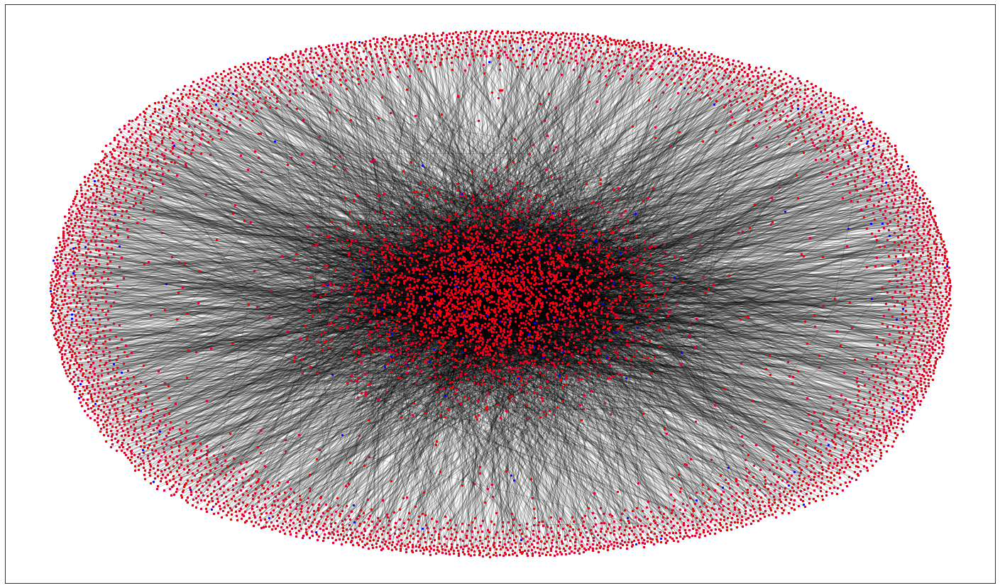

In [25]:
plt.figure(figsize=(25,15))
nx.draw_networkx_nodes(G, pos,node_color = 'blue', node_size=5)
nx.draw_networkx_nodes(GC, pos,node_color = 'red', node_size=5)
nx.draw_networkx_edges(GC, pos, alpha=0.2)
plt.show()

In [16]:
selected_node = []

while len(selected_node) <= 5*int(len(G.nodes)/10):
    start_node = random.choice(list(G.nodes))
    if start_node not in selected_node:
        selected_node.append(start_node)

G_50 = G.copy()
G_50.remove_nodes_from(selected_node)

In [17]:
print(nx.info(G_50))

Name: 
Type: DiGraph
Number of nodes: 4361
Number of edges: 7541
Average in degree:   1.7292
Average out degree:   1.7292


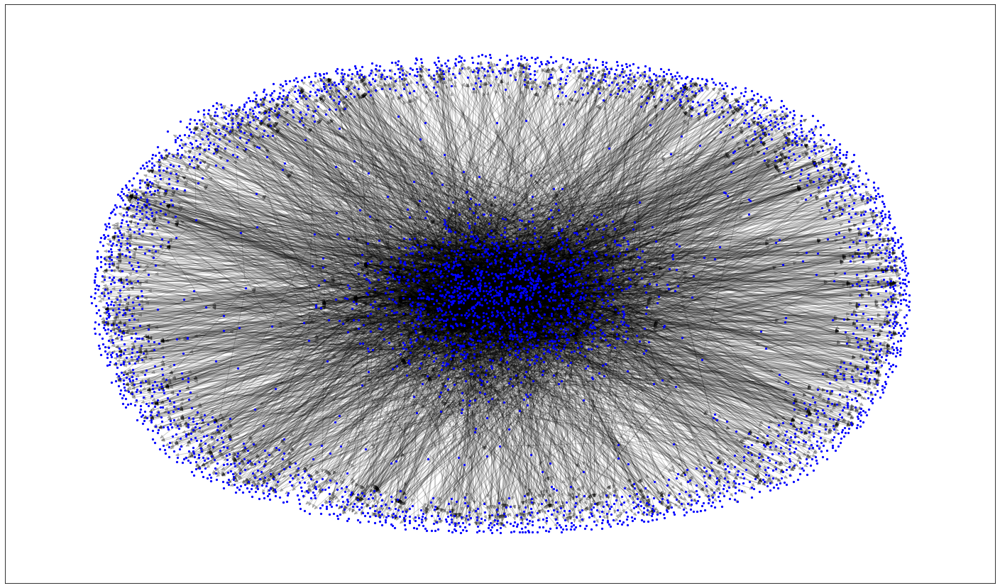

In [18]:
plt.figure(figsize=(25,15))
nx.draw_networkx_nodes(G_50, pos,node_color = 'blue', node_size=5)
nx.draw_networkx_edges(G_50, pos, alpha=0.2)
plt.show()

In [61]:
largest_scc = max(nx.strongly_connected_components(G_50), key=len)

In [62]:
SCC = G_50.subgraph(largest_scc)

In [63]:
print(nx.info(SCC))

Name: 
Type: DiGraph
Number of nodes: 810
Number of edges: 1794
Average in degree:   2.2148
Average out degree:   2.2148


In [64]:
print(nx.distance_measures.diameter(SCC))

27


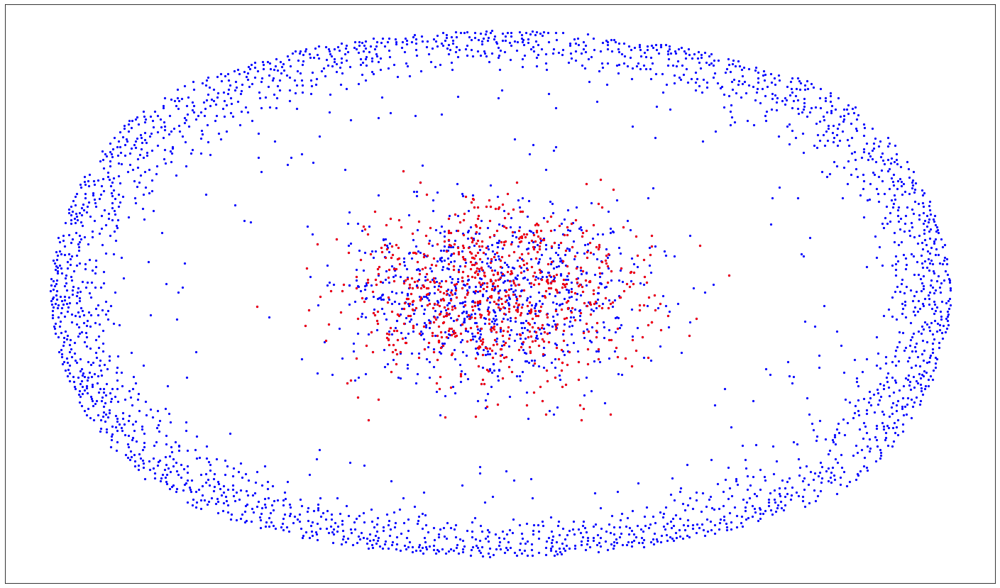

In [65]:
plt.figure(figsize=(25,15))
nx.draw_networkx_nodes(G_50, pos,node_color = 'blue', node_size=5)
nx.draw_networkx_nodes(SCC, pos,node_color = 'red', node_size=5)
plt.show()

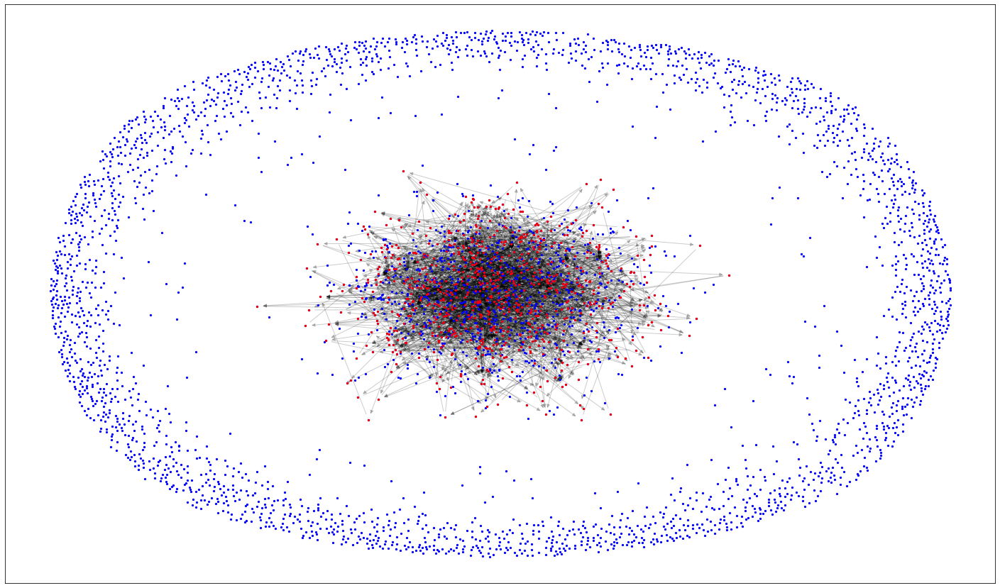

In [66]:
plt.figure(figsize=(25,15))
nx.draw_networkx_nodes(G_50, pos,node_color = 'blue', node_size=5)
nx.draw_networkx_nodes(SCC, pos,node_color = 'red', node_size=5)
nx.draw_networkx_edges(SCC, pos, alpha=0.2)
plt.show()

In [19]:
largest_wcc = max(nx.weakly_connected_components(G_50), key=len)

In [20]:
WCC = G_50.subgraph(largest_wcc)

In [21]:
print(nx.info(WCC))

Name: 
Type: DiGraph
Number of nodes: 3580
Number of edges: 7532
Average in degree:   2.1039
Average out degree:   2.1039


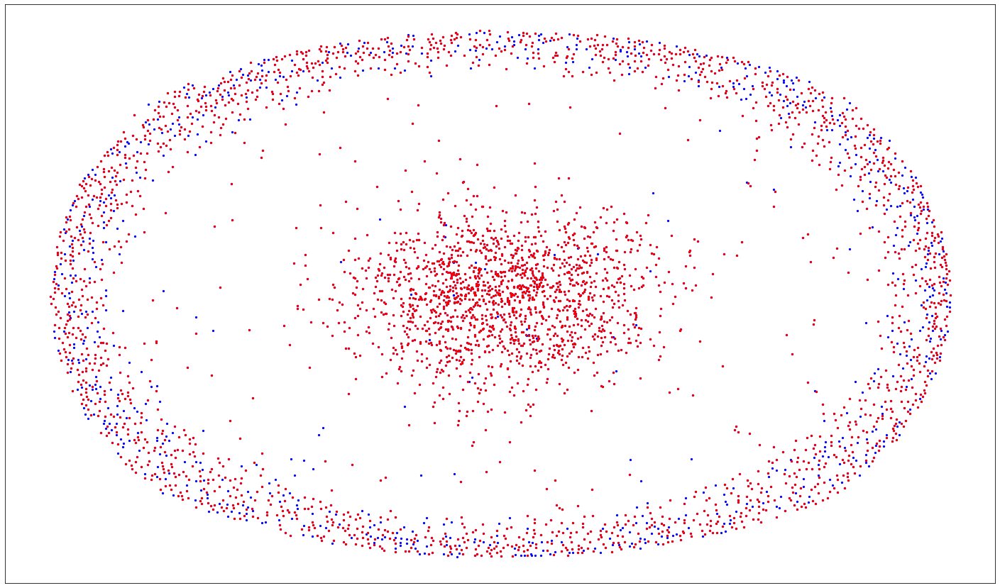

In [23]:
plt.figure(figsize=(25,15))
nx.draw_networkx_nodes(G_50, pos,node_color = 'blue', node_size=5)
nx.draw_networkx_nodes(WCC, pos,node_color = 'red', node_size=5)
plt.show()

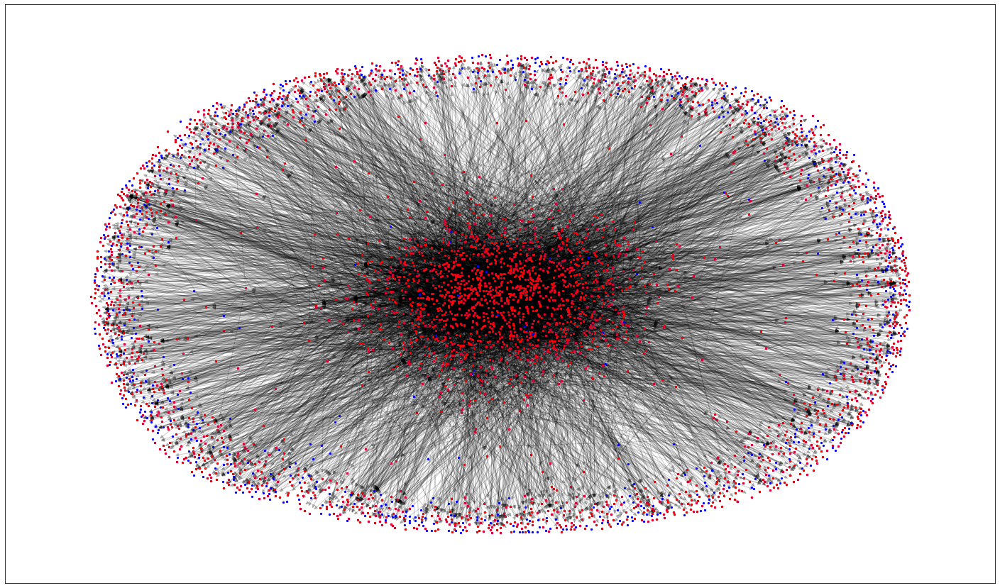

In [24]:
plt.figure(figsize=(25,15))
nx.draw_networkx_nodes(G_50, pos,node_color = 'blue', node_size=5)
nx.draw_networkx_nodes(WCC, pos,node_color = 'red', node_size=5)
nx.draw_networkx_edges(WCC, pos, alpha=0.2)
plt.show()

In [25]:
selected_node = []

while len(selected_node) <= 9*int(len(G.nodes)/10):
    start_node = random.choice(list(G.nodes))
    if start_node not in selected_node:
        selected_node.append(start_node)

G_10 = G.copy()
G_10.remove_nodes_from(selected_node)

In [68]:
print(nx.info(G_10))

Name: 
Type: DiGraph
Number of nodes: 877
Number of edges: 369
Average in degree:   0.4208
Average out degree:   0.4208


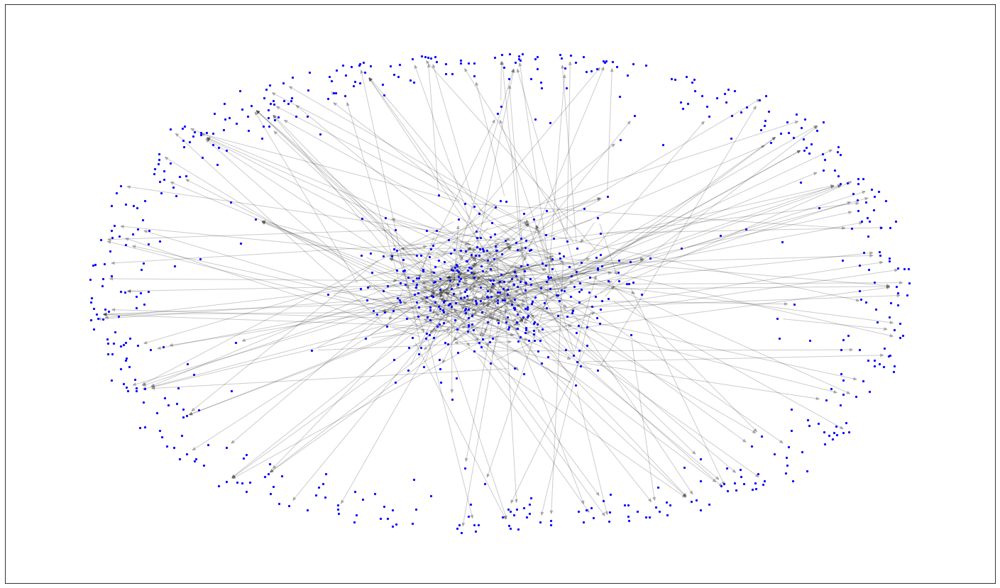

In [69]:
plt.figure(figsize=(25,15))
nx.draw_networkx_nodes(G_10, pos,node_color = 'blue', node_size=5)
nx.draw_networkx_edges(G_10, pos, alpha=0.2)
plt.show()

In [70]:
largest_scc = max(nx.strongly_connected_components(G_10), key=len)

In [71]:
SCC = G_10.subgraph(largest_scc)

In [72]:
print(nx.info(SCC))

Name: 
Type: DiGraph
Number of nodes: 1
Number of edges: 0
Average in degree:   0.0000
Average out degree:   0.0000


In [73]:
print(nx.distance_measures.diameter(SCC))

0


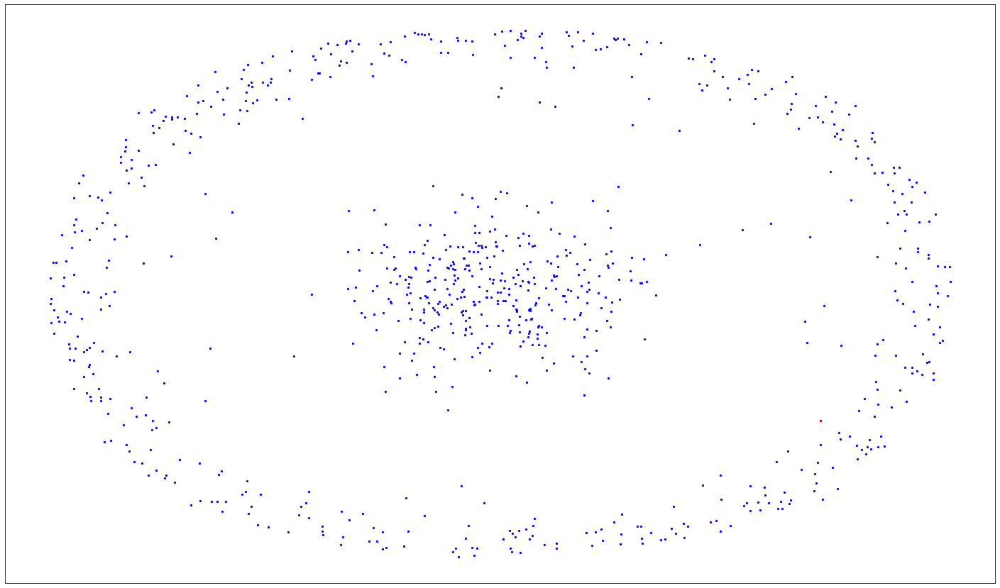

In [74]:
plt.figure(figsize=(25,15))
nx.draw_networkx_nodes(G_10, pos,node_color = 'blue', node_size=5)
nx.draw_networkx_nodes(SCC, pos,node_color = 'red', node_size=5)
plt.show()

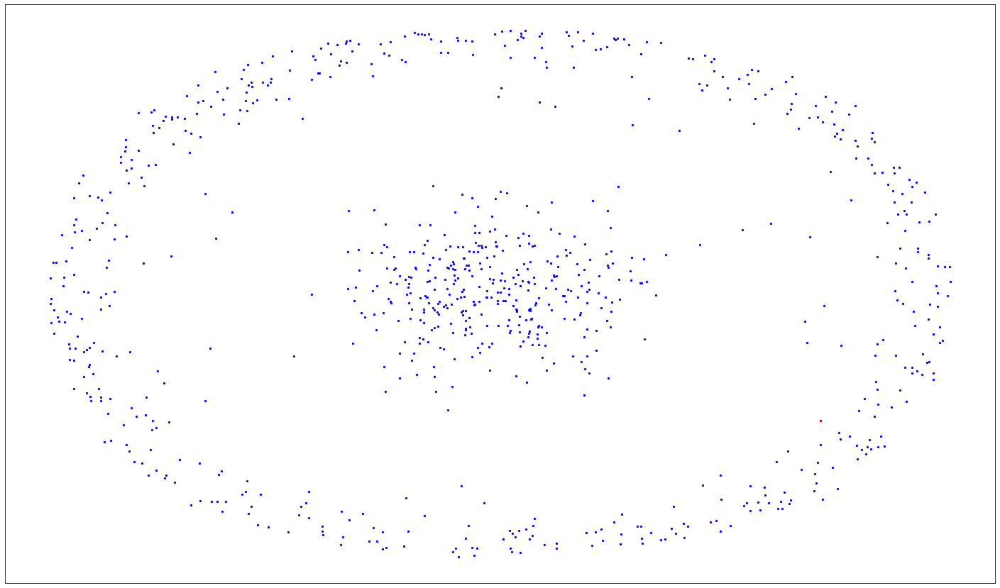

In [75]:
plt.figure(figsize=(25,15))
nx.draw_networkx_nodes(G_10, pos,node_color = 'blue', node_size=5)
nx.draw_networkx_nodes(SCC, pos,node_color = 'red', node_size=5)
nx.draw_networkx_edges(SCC, pos, alpha=0.2)
plt.show()

In [76]:
selected_node = []

while len(selected_node) <= 19*int(len(G.nodes)/20):
    start_node = random.choice(list(G.nodes))
    if start_node not in selected_node:
        selected_node.append(start_node)

G_5 = G.copy()
G_5.remove_nodes_from(selected_node)

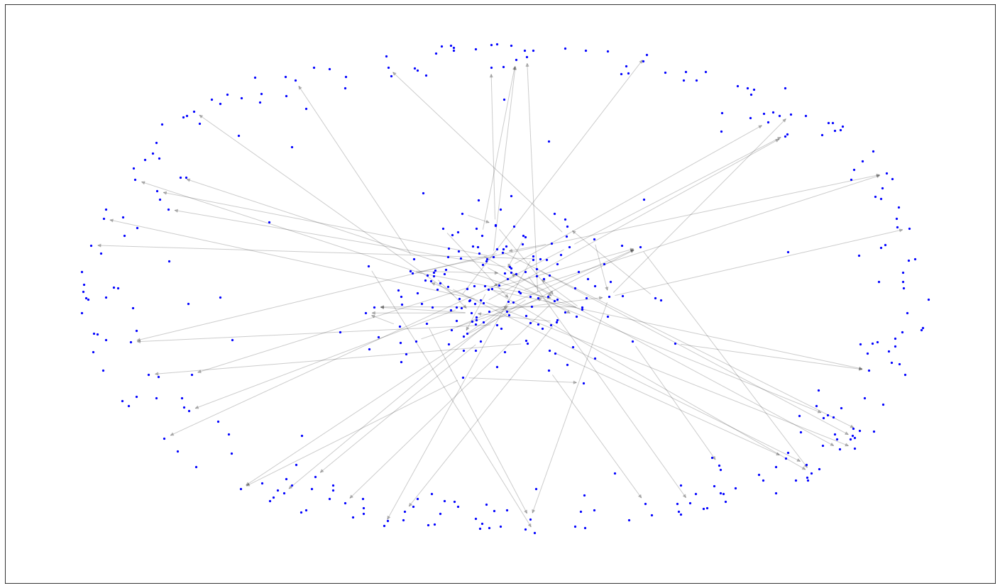

In [77]:
plt.figure(figsize=(25,15))
nx.draw_networkx_nodes(G_5, pos,node_color = 'blue', node_size=5)
nx.draw_networkx_edges(G_5, pos, alpha=0.2)
plt.show()

In [78]:
print(nx.info(G_5))

Name: 
Type: DiGraph
Number of nodes: 451
Number of edges: 80
Average in degree:   0.1774
Average out degree:   0.1774


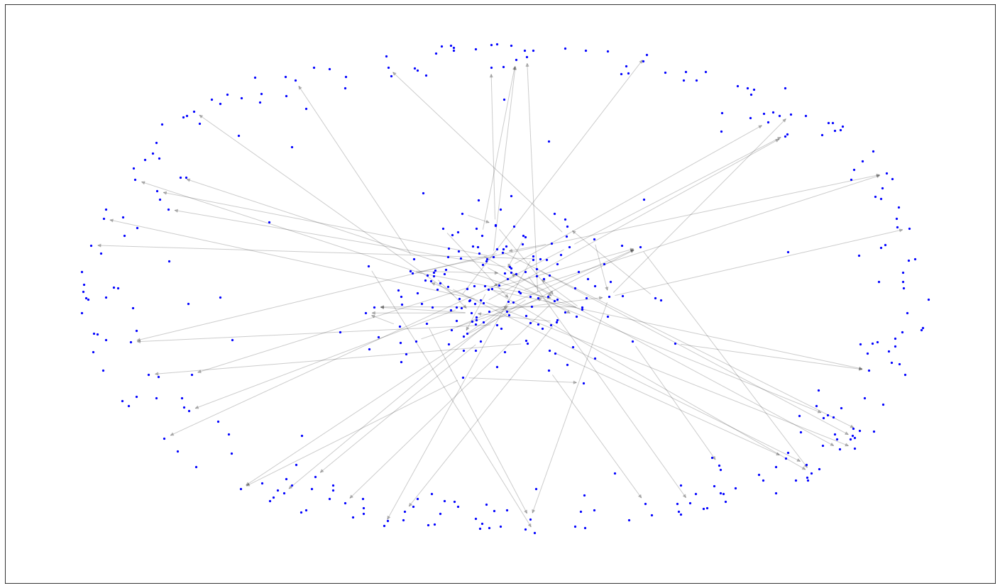

In [79]:
plt.figure(figsize=(25,15))
nx.draw_networkx_nodes(G_5, pos,node_color = 'blue', node_size=5)
nx.draw_networkx_edges(G_5, pos, alpha=0.2)
plt.show()

In [80]:
largest_scc = max(nx.strongly_connected_components(G_5), key=len)

In [81]:
SCC = G_5.subgraph(largest_scc)

In [82]:
print(nx.info(SCC))

Name: 
Type: DiGraph
Number of nodes: 1
Number of edges: 0
Average in degree:   0.0000
Average out degree:   0.0000


In [83]:
print(nx.distance_measures.diameter(SCC))

0


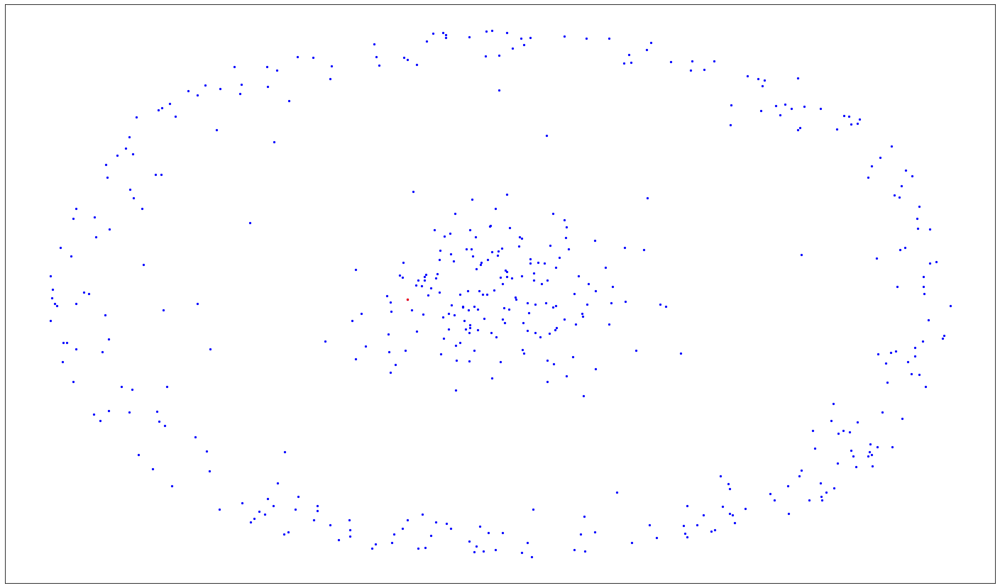

In [84]:
plt.figure(figsize=(25,15))
nx.draw_networkx_nodes(G_5, pos,node_color = 'blue', node_size=5)
nx.draw_networkx_nodes(SCC, pos,node_color = 'red', node_size=5)
plt.show()

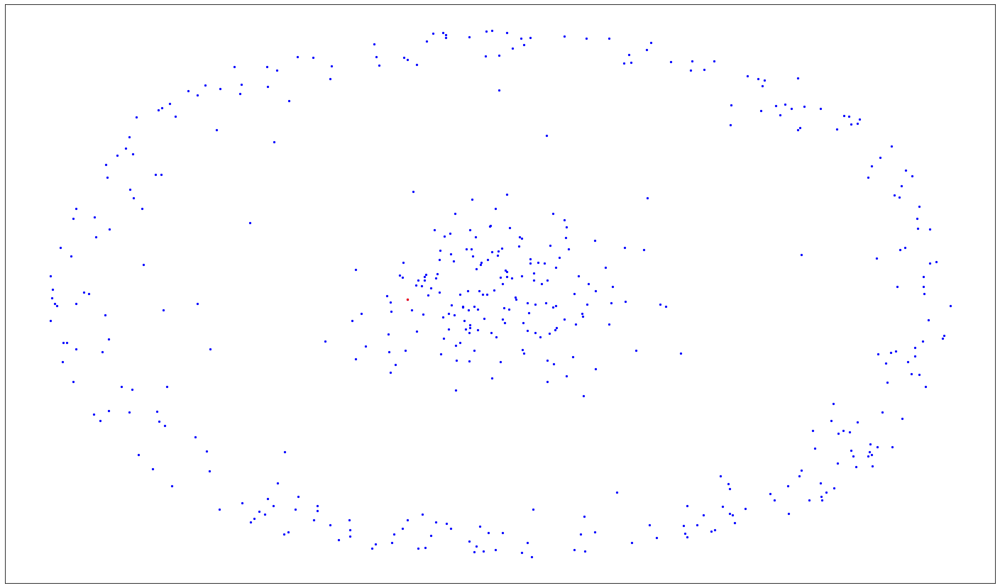

In [85]:
plt.figure(figsize=(25,15))
nx.draw_networkx_nodes(G_5, pos,node_color = 'blue', node_size=5)
nx.draw_networkx_nodes(SCC, pos,node_color = 'red', node_size=5)
nx.draw_networkx_edges(SCC, pos, alpha=0.2)
plt.show()